In [25]:

#by Henry Schumacher
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
import time
start_setup = time.process_time_ns()
print('---------------------------------------')
print(time.strftime("CyclotronKW12.ipynb started: %a, %d %b %Y %H:%M:%S", time.localtime()))
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
import os
import sys
import csv
import json
import uuid
import h5py
import math
import xraydb
import plotly
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
import numpy as np
import pandas as pd
# import pyxray as xy
import odrpack as odr
import seaborn as sb
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
import matplotlib.pyplot as plt
from matplotlib import ticker
from matplotlib.gridspec import GridSpec
from scipy.signal import find_peaks, argrelmax
from scipy.optimize import curve_fit
from scipy.special import voigt_profile
from getmac import get_mac_address as gma
from itertools import chain
from matplotlib.offsetbox import OffsetImage, AnnotationBbox, TextArea, VPacker
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
from colors import load_colors
from Cyc_functions import lin_func, evaluator_scipy, energy_func
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#

from matplotlib import rc
# rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
## for Palatino and other serif fonts use:
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times"],
    "text.usetex": True,
    "font.size": 8,
    "pgf.rcfonts": False
})


plt.rcParams.update({
    "pgf.texsystem": "pdflatex",
    "pgf.preamble": "\n".join([
          r'\usepackage{amsmath}',
     ]),
})

#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#
color_schemes = load_colors()


end_setup = time.process_time_ns()
elapsed_setup = (end_setup - start_setup)/1e6

print(f'INFO: SETUP COMPLETE ({elapsed_setup:.2f} ms)')
print('---------------------------------------')
#-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-o-#

---------------------------------------
CyclotronKW12.ipynb started: Wed, 01 Apr 2026 10:32:34
INFO: SETUP COMPLETE (0.00 ms)
---------------------------------------


## Loading Measurement Data

In [4]:
df = pd.read_csv('./2026_KW12/KW12_measurement.csv', header=0, delimiter=',')
print(df)

     HF Frequency / MHz  HF Preselect / Skt  HF Voltage / mV  \
0               22.9577                 751             37.6   
1               22.9577                 950             48.0   
2               22.9577                 900             45.4   
3               22.9577                 875             44.1   
4               22.9577                 850             42.8   
..                  ...                 ...              ...   
156             22.9617                 875             44.3   
157             22.9617                 900             45.5   
158             22.9617                 855             43.2   
159             22.9592                 735             36.8   
160             22.9592                 735             36.8   

     Cup3 Current / muA  ST1 Current / nA  TransEff  TransEffProcent  
0                 22.50               700    0.0311             3.11  
1                 24.00               200    0.0083             0.83  
2                 

### HF Preselect Skt vs. Voltage

In [5]:
init_values = [0.1,1]
x_data = df.iloc[:,2].tolist()
y_data = df.iloc[:,1].tolist()
x_err = np.array([0.1]*len(x_data))
y_err = np.array([2.0]*len(x_data))

beta = evaluator_scipy(func=lin_func, beta0_list=init_values,
                           x=x_data, y=y_data,
                           xerr=x_err, yerr=y_err)

param_h = [beta['param'][0] + beta['errors'][0], beta['param'][1] + beta['errors'][1]]
param_l = [beta['param'][0] - beta['errors'][0], beta['param'][1] - beta['errors'][1]]

PARAMS: [19.17209043 27.72294079]
UNCERT: [0.02632669 1.05701354]


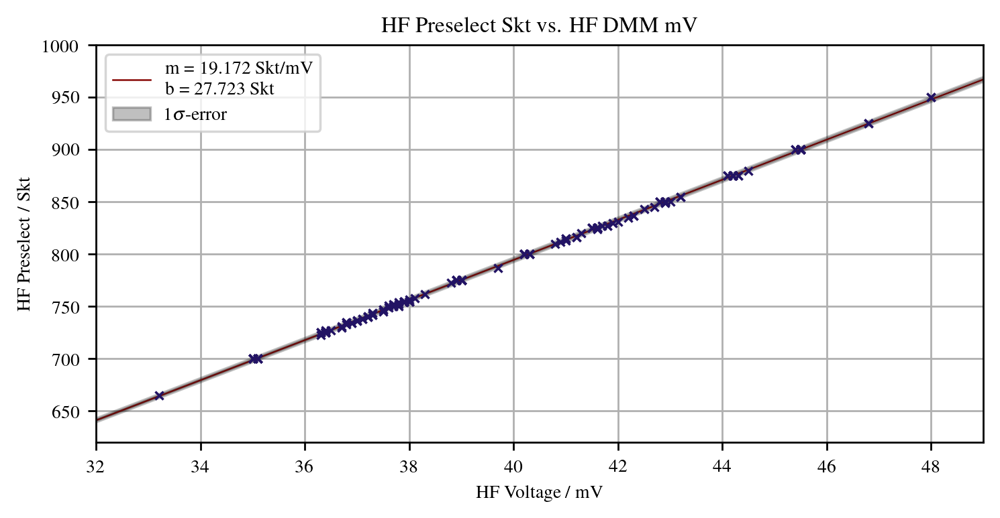

In [7]:
DPI = 250
x_lin = np.linspace(30,50,1000)
plt.figure(figsize=(6,3), dpi=DPI)
plt.scatter(df.iloc[:,2],df.iloc[:,1],s=12,marker='x',lw=1, c=color_schemes['c_dark'][0], zorder=3)
plt.plot(x_lin,lin_func(beta['param'],x_lin),lw=0.75, color=color_schemes['c_dark'][3], zorder=2, label=f'm = {round(beta['param'][0],3)} Skt/mV \n b = {round(beta['param'][1],3)} Skt')
plt.fill_between(x_lin,lin_func(param_l,x_lin),lin_func(param_h,x_lin),alpha=0.25, color='black', zorder=2, label=r'$1\sigma$-error')

plt.xlim(32,49)
plt.ylim(620,1000)

plt.xlabel('HF Voltage / mV')
plt.ylabel('HF Preselect / Skt')
plt.grid()
plt.legend()
plt.tight_layout()
plt.title('HF Preselect Skt vs. HF DMM mV')

plt.savefig('PreselectVsDMM.pdf', dpi=DPI)
plt.show()

## Heatmap

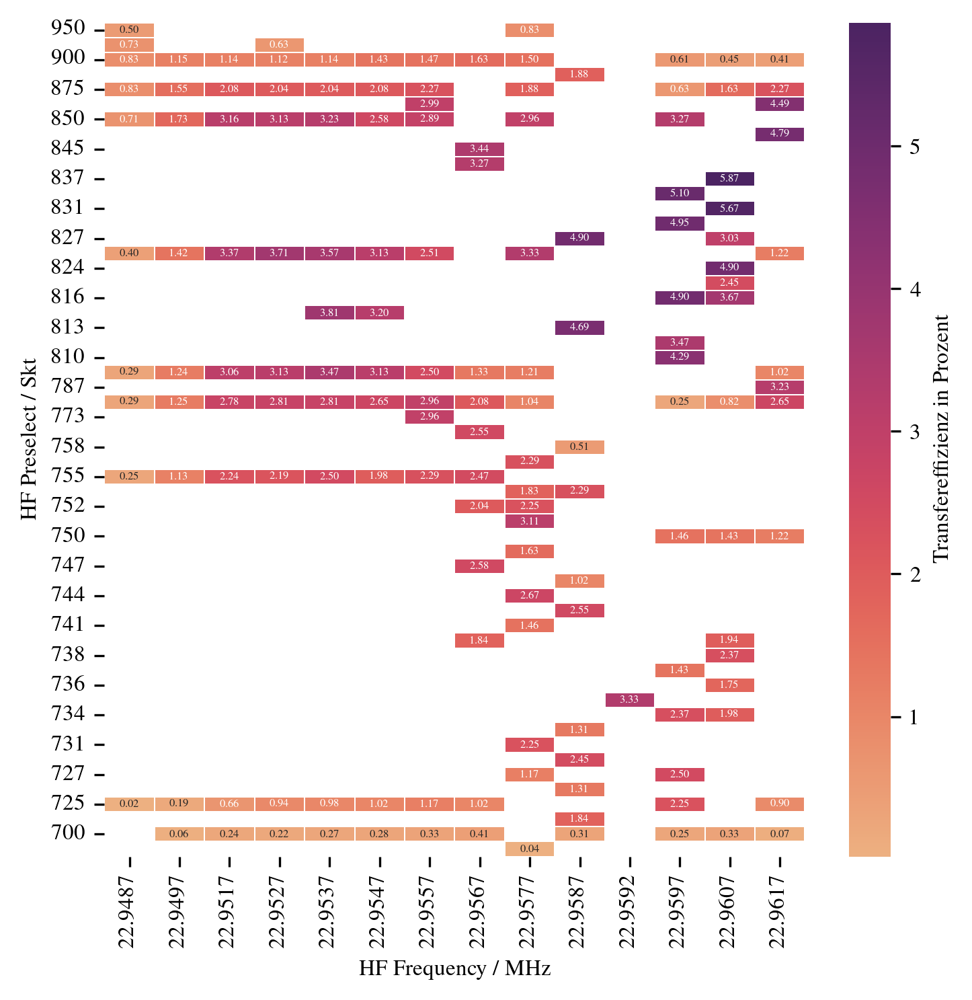

In [19]:
transEff = df.pivot_table(index='HF Preselect / Skt', columns='HF Frequency / MHz', values='TransEffProcent', aggfunc='mean').iloc[::-1]

# print(transEff)
plt.figure(figsize=(5,5), dpi=300)

sb.heatmap(transEff, annot=True, fmt=".2f", annot_kws={'fontsize':4}, cmap='flare', cbar_kws={'label':'Transfereffizienz in Prozent'}, linewidths=0.1)
plt.tight_layout()
plt.savefig('Transfereffizienz2.pdf', dpi=300)


### Dichteschriebe

In [62]:
ds_info = {'./2026_KW12/260319/DS_Tab1_Z2.txt':'22.9577 MHz / 950 Skt / 0.83\%',
           './2026_KW12/260319/DS_Tab1_Z3.txt':'22.9577 MHz / 900 Skt / 1.50\%',
           './2026_KW12/260319/DS_Tab1_Z6.txt':'22.9577 MHz / 825 Skt / 3.33\%',
           './2026_KW12/260319/DS_Tab3_Z7.txt':'22.9497 MHz / 850 Skt / 1.73\%',
           './2026_KW12/260319/DS_Tab5_Z10.txt':'22.9517 MHz / 825 Skt / 3.27\%',
           './2026_KW12/260319/DS_Tab6_Z11.txt':'22.9527 MHz / 825 Skt / 3.71\%',
           './2026_KW12/260319/DS_Tab7_Z10.txt':'22.9537 MHz / 815 Skt / 3.81\%',
           './2026_KW12/260319/DS_Tab8_Z10.txt':'22.9547 MHz / 815 Skt / 3.20\%',
           './2026_KW12/260319/DS_Tab9_Z10.txt':'22.9557 MHz / 773 Skt / 2.96\%',
           './2026_KW12/260319/DS_Tab9_Z11.txt':'22.9557 MHz / 855 Skt / 2.99\%',
           './2026_KW12/260319/DS_Tab10_Z12.txt':'22.9567 MHz / 747 Skt / 2.65\%',
           './2026_KW12/260319/DS_Tab11_Z13.txt':'22.9587 MHz / 827 Skt / 4.90\%',
           './2026_KW12/260319/DS_Tab11_Z14.txt':'22.9587 MHz / 742 Skt / 2.55\%',
           './2026_KW12/260319/DS_Tab12_Z15.txt':'22.9597 MHz / 830 Skt / 4.95\%',
           './2026_KW12/260319/DS_Tab12_Z16.txt':'22.9597 MHz / 727 Skt / 2.50\%',
           './2026_KW12/260319/DS_Tab13_Z16.txt':'22.9607 MHz / 837 Skt / 6.12\%',
           './2026_KW12/260319/DS_Tab14_Z11.txt':'22.9617 MHz / 855 Skt / 4.49\%',
           './2026_KW12/260319/DS_Tab15_Z1.txt':'22.9592 MHz / 735 Skt / 2.29\%',
           './2026_KW12/260319/DS_Tab15_Z2.txt':'22.9592 MHz / 735 Skt / 4.38\% / Buncher'}

<>:1: SyntaxWarning: invalid escape sequence '\%'
<>:2: SyntaxWarning: invalid escape sequence '\%'
<>:3: SyntaxWarning: invalid escape sequence '\%'
<>:4: SyntaxWarning: invalid escape sequence '\%'
<>:5: SyntaxWarning: invalid escape sequence '\%'
<>:6: SyntaxWarning: invalid escape sequence '\%'
<>:7: SyntaxWarning: invalid escape sequence '\%'
<>:8: SyntaxWarning: invalid escape sequence '\%'
<>:9: SyntaxWarning: invalid escape sequence '\%'
<>:10: SyntaxWarning: invalid escape sequence '\%'
<>:11: SyntaxWarning: invalid escape sequence '\%'
<>:12: SyntaxWarning: invalid escape sequence '\%'
<>:13: SyntaxWarning: invalid escape sequence '\%'
<>:14: SyntaxWarning: invalid escape sequence '\%'
<>:15: SyntaxWarning: invalid escape sequence '\%'
<>:16: SyntaxWarning: invalid escape sequence '\%'
<>:17: SyntaxWarning: invalid escape sequence '\%'
<>:18: SyntaxWarning: invalid escape sequence '\%'
<>:19: SyntaxWarning: invalid escape sequence '\%'
<>:1: SyntaxWarning: invalid escape sequ

In [116]:
def DichteschriebPlot(filename:str, ds_info:dict, peak_flag:bool):
    df = pd.read_csv(filename, skiprows=8, delimiter='\t', decimal=",")
    
    freq = ds_info[filename].split('/')[0]
    skt = ds_info[filename].split('/')[1]
    Teff = ds_info[filename].split('/')[2]
    if len(ds_info[filename].split('/')) > 3:
        info = ds_info[filename].split('/')[3]
    
    if (peak_flag == True):
        peaks = find_peaks(np.array(df['Real'].tolist()),height=0.5,prominence=0.05)
        # print(peaks[0])
    
    plt.figure(figsize=(12,4), dpi=300)
    
    plt.plot(df['Real.1']*100, df['Real'], color=color_schemes['c_five'][1], lw=1, zorder=2, label=f'Frequency: {freq} \n HF Preselect: {skt} \n Transport-efficiency: {Teff}%')
    if (peak_flag == True):
        plt.scatter(df['Real.1'][peaks[0]]*100, df['Real'][peaks[0]], s=13, marker='x', lw=0.8, color=color_schemes['c_dark'][0], label=f'Detected peaks: {len(peaks[0])}', zorder=3, alpha=0.5)
    
    plt.xticks(np.arange(150,950,50),np.arange(150,950,50))
    
    plt.xlabel('Radial Position / mm')
    plt.ylabel('Beam Intensity / a.u.')
    
    plt.grid(which='both')
    plt.legend()
    plt.tight_layout()
    
    if (peak_flag == True):
        plt.savefig(f'./Dichteschriebe_python/{filename.split('/')[3].split('.')[0]}_peaks.pdf', dpi=300)
    else:
        plt.savefig(f'./Dichteschriebe_python/{filename.split('/')[3].split('.')[0]}.pdf', dpi=300)

./2026_KW12/260319/DS_Tab10_Z12.txt
[  95  177  254  326  394  456  520  581  635  686  733  778  821  864
  905  943  979 1011 1042 1073 1108 1146 1182 1224 1257 1289 1320 1354
 1387 1418 1446 1472 1493 1513 1539 1569 1597 1625 1656 1689 1723 1758
 1786 1814 1836 1849 1870 1895 1918 1945 1972 2003 2031 2060 2087 2115
 2143 2167 2184 2203 2227 2253 2279 2310 2337 2365 2393 2419 2443 2455
 2477 2503 2524 2527 2552 2578 2607 2633 2660 2689 2704 2726 2746 2767
 2794 2817 2847 2873 2960 3022 3045 3069 3099 3205 3262 3284 3307 3334
 3466 3515 3534 3562 3586 3644 3676 3743]
./2026_KW12/260319/DS_Tab11_Z13.txt
[  74  170  259  342  419  491  560  624  684  741  791  834  879  922
  965 1007 1050 1095 1140 1184 1228 1272 1310 1345 1376 1384 1407 1439
 1472 1504 1520 1536 1547 1574 1590 1609 1620 1652 1682 1716 1749 1781
 1796 1815 1845 1875 1884 1906 1931 1958 1981 2004 2017 2027 2052 2084
 2119 2151 2166 2184 2213 2243 2266 2292 2319 2344 2366 2392 2423 2452
 2481 2509 2518 2535 2558 2580 260

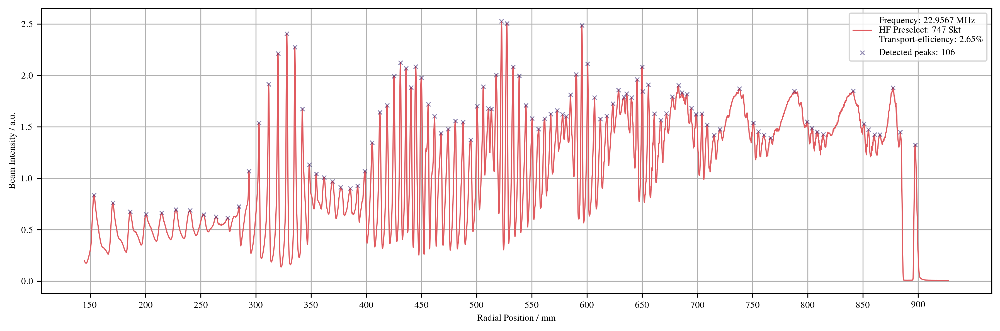

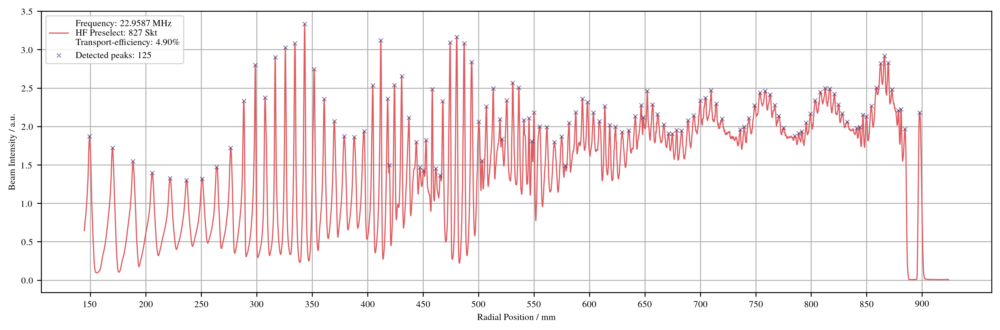

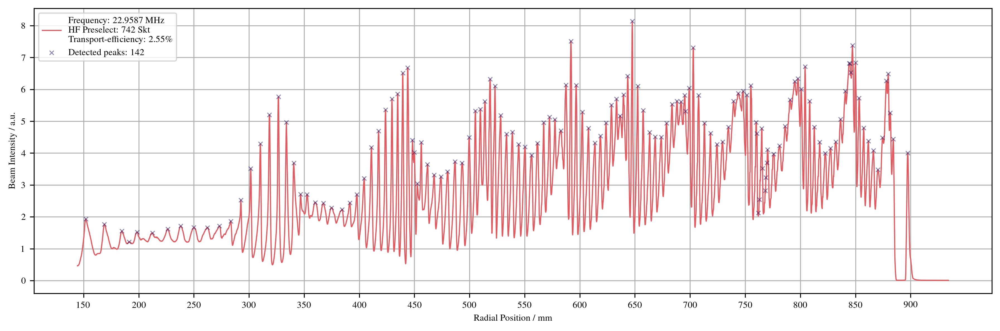

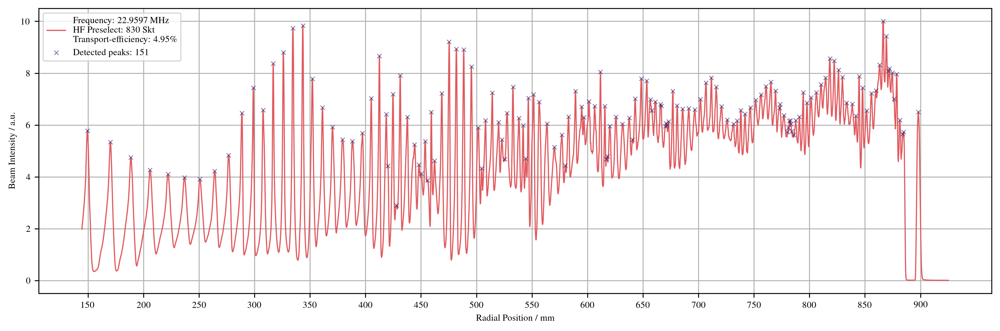

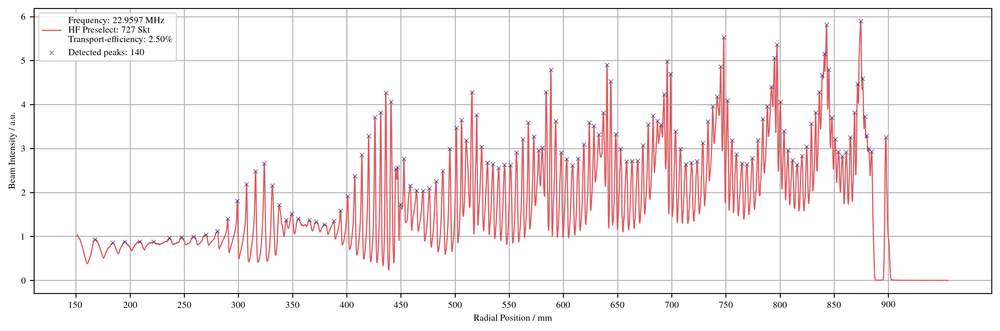

...

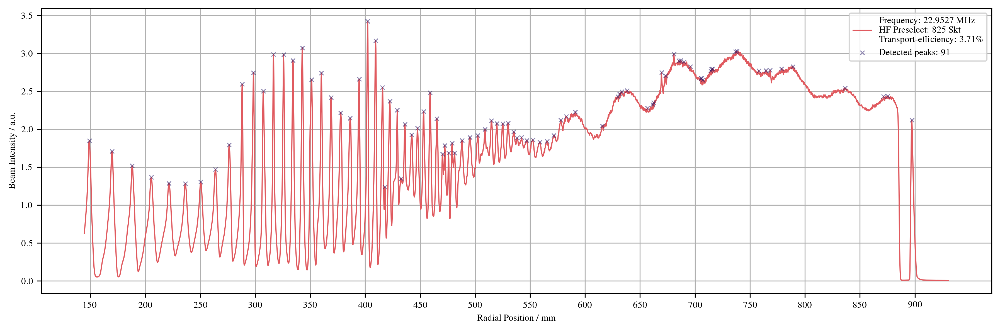

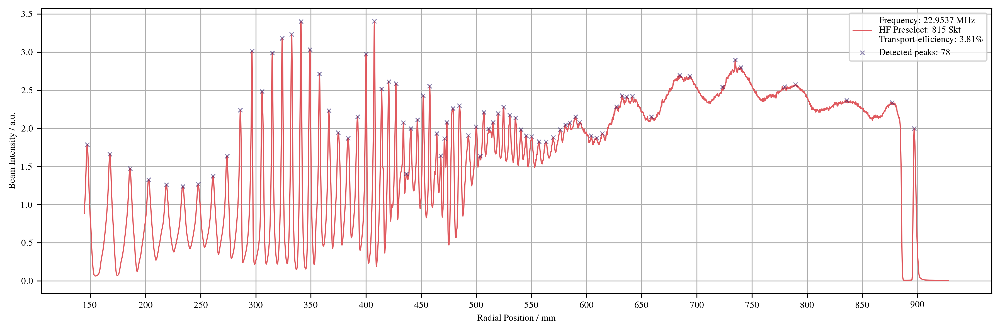

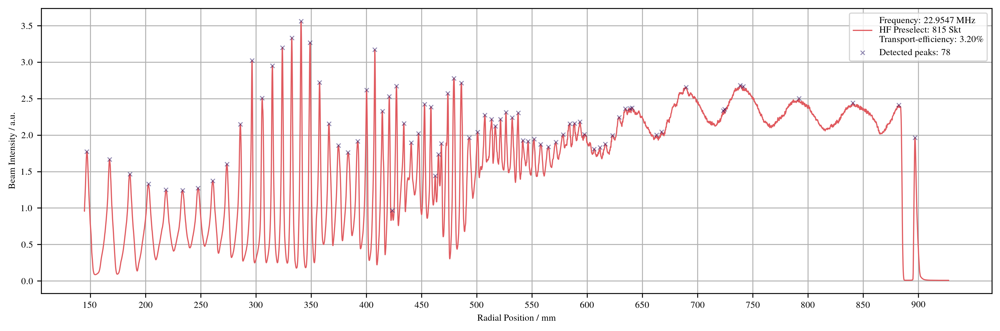

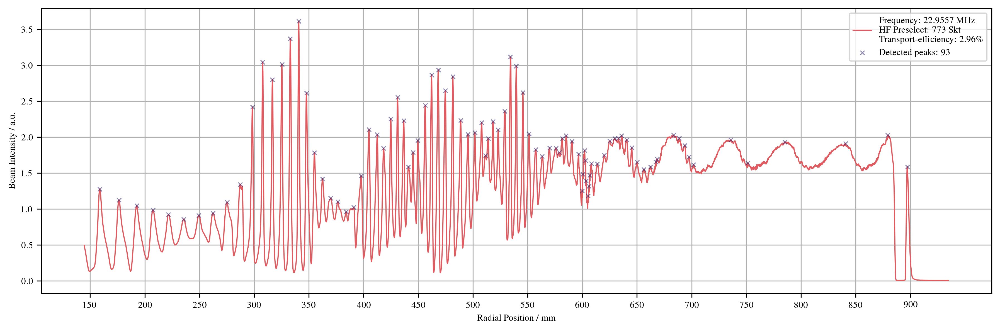

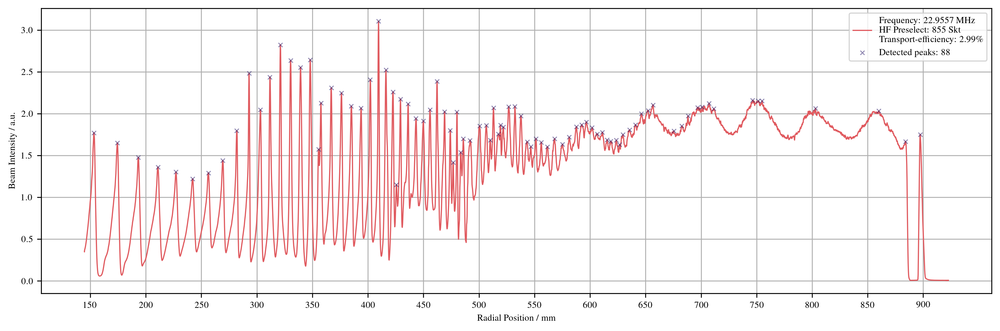

In [115]:
for file in os.listdir('./2026_KW12/260319'):
    path = f'./2026_KW12/260319/{file}'
    if os.path.isfile(path) == True:
        print(path)
        DichteschriebPlot(path,ds_info,peak_flag=True)
# DichteschriebPlot('./2026_KW12/260319/DS_Tab1_Z2.txt', ds_info, peak_flag=True)

## HF Fake kV vs. HF DMM mV

PARAMS: [ 0.32757037 10.5212922 ]
UNCERT: [0.03252081 1.3195776 ]


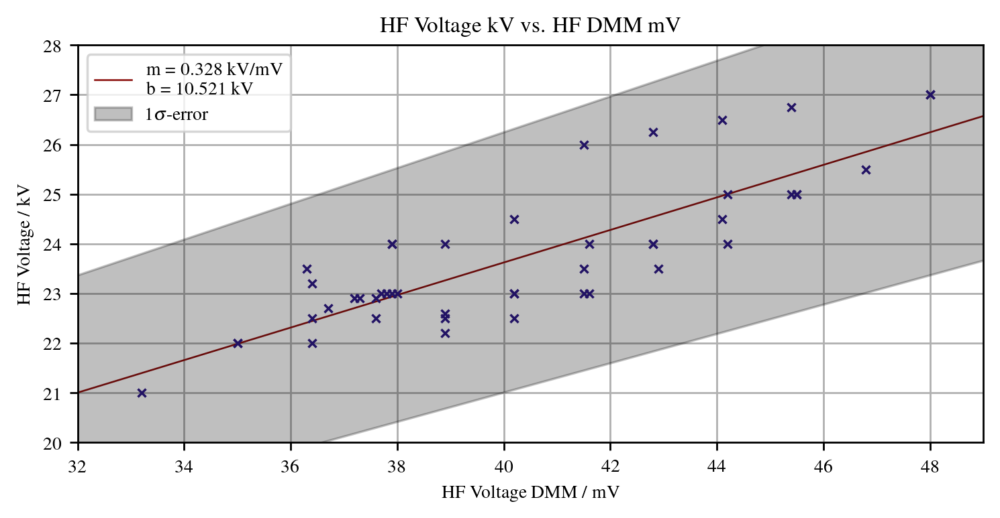

In [16]:
df_HF = pd.read_csv('./2026_KW12/HF_fake.csv', header=0, delimiter=',')
# print(df_HF)
init_values = [0.3,10]
x_data_HF = df_HF.iloc[:,1].tolist()
y_data_HF = df_HF.iloc[:,0].tolist()
x_err_HF = np.array([0.1]*len(x_data_HF))
y_err_HF = np.array([2.0]*len(x_data_HF))

beta_HF = evaluator_scipy(func=lin_func, beta0_list=init_values,
                           x=x_data_HF, y=y_data_HF,
                           xerr=x_err_HF, yerr=y_err_HF)

param_h = [beta_HF['param'][0] + beta_HF['errors'][0], beta_HF['param'][1] + beta_HF['errors'][1]]
param_l = [beta_HF['param'][0] - beta_HF['errors'][0], beta_HF['param'][1] - beta_HF['errors'][1]]


DPI = 250
x_lin = np.linspace(30,50,1000)
plt.figure(figsize=(6,3), dpi=DPI)
plt.scatter(df.iloc[:,1],df.iloc[:,0],s=12,marker='x',lw=1, c=color_schemes['c_dark'][0], zorder=3)
plt.plot(x_lin,lin_func(beta_HF['param'],x_lin),lw=0.75, color=color_schemes['c_dark'][3], zorder=2, label=f'm = {round(beta_HF['param'][0],3)} kV/mV \n b = {round(beta_HF['param'][1],3)} kV')
plt.fill_between(x_lin,lin_func(param_l,x_lin),lin_func(param_h,x_lin),alpha=0.25, color='black', zorder=2, label=r'$1\sigma$-error')

plt.xlim(32,49)
plt.ylim(20,28)

plt.xlabel('HF Voltage DMM / mV')
plt.ylabel('HF Voltage / kV')
plt.grid()
plt.legend()
plt.tight_layout()
plt.title('HF Voltage kV vs. HF DMM mV')

plt.savefig('FakeHFVsDMM.pdf', dpi=DPI)
plt.show()

In [28]:
dmm_lin = np.arange(32,50.1,0.1)
dmm_prm = [0.32757037,10.5212922]
hf_volt = np.array(lin_func(dmm_prm,dmm_lin))
hf_volt_3f = [ '%.3f' % elem for elem in hf_volt ]
dmm_lin_3f = [ '%.3f' % elem for elem in dmm_lin ]
forMarkus = dict(zip(dmm_lin_3f, hf_volt_3f))
print(forMarkus)

with open('FakeHFVoltage.csv', 'w') as csv_file:  
    writer = csv.writer(csv_file)
    for key, value in forMarkus.items():
       writer.writerow([key, value])

{'32.000': '21.004', '32.100': '21.036', '32.200': '21.069', '32.300': '21.102', '32.400': '21.135', '32.500': '21.167', '32.600': '21.200', '32.700': '21.233', '32.800': '21.266', '32.900': '21.298', '33.000': '21.331', '33.100': '21.364', '33.200': '21.397', '33.300': '21.429', '33.400': '21.462', '33.500': '21.495', '33.600': '21.528', '33.700': '21.560', '33.800': '21.593', '33.900': '21.626', '34.000': '21.659', '34.100': '21.691', '34.200': '21.724', '34.300': '21.757', '34.400': '21.790', '34.500': '21.822', '34.600': '21.855', '34.700': '21.888', '34.800': '21.921', '34.900': '21.953', '35.000': '21.986', '35.100': '22.019', '35.200': '22.052', '35.300': '22.085', '35.400': '22.117', '35.500': '22.150', '35.600': '22.183', '35.700': '22.216', '35.800': '22.248', '35.900': '22.281', '36.000': '22.314', '36.100': '22.347', '36.200': '22.379', '36.300': '22.412', '36.400': '22.445', '36.500': '22.478', '36.600': '22.510', '36.700': '22.543', '36.800': '22.576', '36.900': '22.609',